# Adaptation to Flood and Windstorm Impacts on the Trans-European Transport Network (TEN-T)

This analysis examines the risk and expected damages of TEN-T corridor infrastructure to climate hazards, with specific focus on:

1. **Spatial distribution of exposed assets**: Mapping the location and extent of TEN-T infrastructure across different transport modes.
2. **Flow-weighted criticality assessment**: Identifying high-priority infrastructure based on freight and passenger volumes.
3. **Hazard exposure quantification**: Assessing infrastructure exposure to flooding and wind storm events across different return periods.
4. **Economic impact evaluation**: Quantifying direct damages and expected annual damage (EAD) under current and future climate scenarios.

## 1. Setup and Configuration

The TEN-T (Trans-European Transport Network) connects major European cities and ports through dedicated freight and passenger corridors.

This section imports required libraries and loads foundational data:

- **Base map**: European country boundaries.
- **Libraries**: GeoPandas for spatial data, Pandas for tabular data, Matplotlib for visualisation
- **TEN-T Corridors**: 9 major European transport corridors (A-L) with unique colours for identification.
- **Utility functions**: Custom functions from `tent_utils.py` for corridor extraction and visualisation.

In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings('ignore')

# Import utility functions
from tent_utils import (
    extract_corridors,
    setup_ax,
    get_linewidth_freight,
    get_linewidth_passenger,
    get_markersize_freight,
    get_markersize_passenger,
    plot_by_corridor_and_visual_attr,
    reproject_raster_to_3035,
    aggregate_by_location,
    create_flow_legend,
    load_infrastructure_parquet,
    reproject_infrastructure_dict,
    merge_risk_data_preserve_geometry,
    format_log_colorbar
)

# Set plotting style
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline

# Data paths
code_dir = Path.cwd()
inputs_dir = code_dir.parent / "inputs" / "europe_corridors_with_flows"

# File paths for infrastructure with flows
infrastructure_files = {
    "railway_edges": inputs_dir / "europe_railway_edges_corridors_with_flows.parquet",
    "railway_stations": inputs_dir / "europe_railway_stations_corridors_with_flows.parquet",
    "iww_edges": inputs_dir / "europe_iww_edges_corridors_with_flows.parquet",
    "airports": inputs_dir / "europe_airports_corridors_with_flows.parquet",
    "ports": inputs_dir / "europe_ports_corridors_with_flows.parquet",
}

# TEN-T corridor configuration
corridor_order = ['A', 'B', 'C', 'E', 'G', 'I', 'J', 'K', 'L', 'U']

corridor_legend = [
    'Baltic-Adriatic',
    'North Sea-Adriatic',
    'Mediterranean',
    'Scandinavian-Mediterranean',
    'Atlantic',
    'Rhine-Danube',
    'Baltic-Aegean',
    'W. Balkans-E. Mediterranean',
    'North Sea-Mediterranean',
    'Not-in-corridor'
]

corridor_palette = [
    '#0080C0',  # Blue - Baltic-Adriatic
    '#E91E8C',  # Magenta/Pink - North Sea-Adriatic
    '#00A651',  # Green - Mediterranean
    '#FF69B4',  # Light Pink - Scandinavian-Mediterranean
    '#FFD700',  # Yellow/Gold - Atlantic
    '#00BFFF',  # Cyan/Light Blue - Rhine-Danube
    '#8B4789',  # Purple - Baltic-Aegean
    '#8B4513',  # Brown - W. Balkans-E. Mediterranean
    '#228B22',  # Dark Green - North Sea-Mediterranean
    '#b3b3b3'   # Gray - Not-in-corridor
]

# Create corridor mapping dictionaries
corridor_colors = dict(zip(corridor_order, corridor_palette))
corridor_names = dict(zip(corridor_order, corridor_legend))

# Load European country boundaries
print("Loading European country boundaries...")
try:
    countries_path = code_dir.parent / "inputs" / "ne_10m" / "ne_10m_admin_0_countries.shp"
    europe_countries = gpd.read_file(countries_path)
    europe_countries = europe_countries[europe_countries['CONTINENT'] == 'Europe']
    europe_countries = europe_countries.to_crs('EPSG:3035')
    print(f"Loaded {len(europe_countries)} European countries")
except Exception as e:
    print(f"Could not load country boundaries: {e}")
    europe_countries = None

Loading European country boundaries...
Loaded 51 European countries


## 2. Load Infrastructure Data

Loads geospatial infrastructure datasets from parquet files, including:

- **Ports**: Maritime terminals with cargo and passenger statistics.
- **Railway edges**: Rail network segments with flow data.
- **Airports**: Air transport hubs with passenger/freight volumes.
- **Railway stations**: Station locations and capacities.
- **Inland waterways (IWW)**: River and canal transport routes.

In [2]:
print("Loading infrastructure data...\n")

infrastructure = {}

# Load all infrastructure files
for infra_type, file_path in infrastructure_files.items():
    gdf = load_infrastructure_parquet(file_path, infra_type)
    if gdf is not None:
        infrastructure[infra_type] = gdf

print(f"\nLoaded {len(infrastructure)} infrastructure types")

# Reproject all to EPSG:3035
infrastructure = reproject_infrastructure_dict(infrastructure)

# Add corridor information using utility function
for infra_type, gdf in infrastructure.items():
    if 'CORRIDORS' in gdf.columns:
        gdf['corridor_list'] = gdf['CORRIDORS'].apply(extract_corridors)
        gdf['primary_corridor'] = gdf['corridor_list'].apply(lambda x: x[0] if len(x) > 0 else 'Unknown')
        print(f"{infra_type}: {gdf['primary_corridor'].nunique()} unique primary corridors")

Loading infrastructure data...

railway_edges       : File not found
railway_stations    : File not found
iww_edges           : File not found
airports            : File not found
ports               : File not found

Loaded 0 infrastructure types


## 3. Visualise All Assets by Corridor

This overview reveals the geographic extent of each corridor and identifies key multimodal hubs where different transport modes intersect.

Comprehensive map showing the spatial distribution of all TEN-T infrastructure coloured by corridor:

- **Colour coding**: Each corridor has a unique colour (e.g., blue for Baltic-Adriatic, green for Mediterranean).
- **Network edges**: Railway (thin lines), roads (dashed), and inland waterways (thick dash-dot)
- **Node facilities**: Ports (circles), airports (triangles), railway stations (squares).

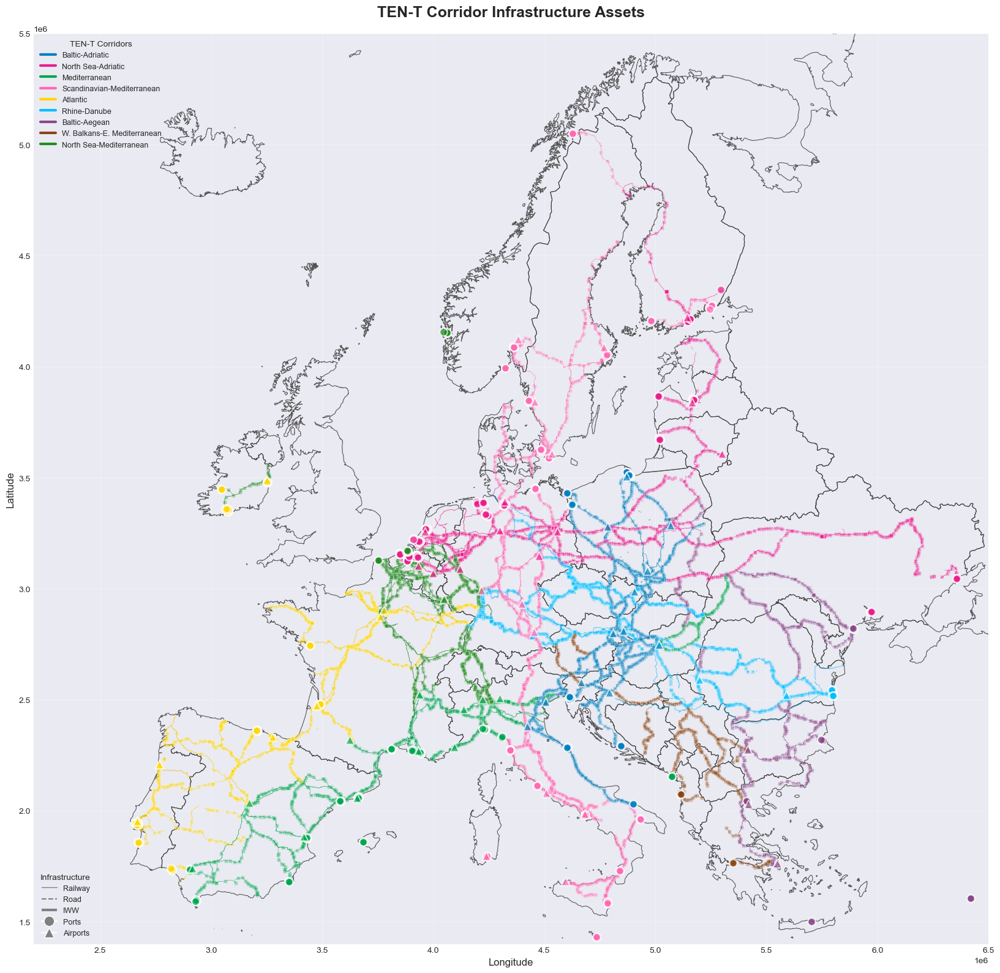

In [3]:
fig, ax = plt.subplots(1, 1, figsize=(20, 16))

# Use utility function to set up the map
setup_ax(ax, europe_countries, infrastructure)

# Plot edges (railway, road, and IWW)
for infra_type in ['railway_edges', 'road_edges', 'iww_edges']:
    if infra_type in infrastructure:
        gdf = infrastructure[infra_type]
        if infra_type == 'railway_edges':
            linewidth = 0.5
        elif infra_type == 'road_edges':
            linewidth = 0.6
        else:  # iww_edges
            linewidth = 0.8
        
        for corridor in corridor_colors.keys():
            mask = gdf['primary_corridor'] == corridor
            if mask.any():
                gdf[mask].plot(
                    ax=ax,
                    color=corridor_colors[corridor],
                    linewidth=linewidth,
                    alpha=0.6,
                    zorder=2
                )

# Plot nodes (ports, airports, railway stations)
for infra_type in ['ports', 'airports', 'railway_stations', 'iww_nodes']:
    if infra_type in infrastructure:
        gdf = infrastructure[infra_type]
        
        marker = 'o' if infra_type in ['ports', 'iww_nodes'] else ('^' if infra_type == 'airports' else 's')
        size = 100 if infra_type == 'airports' else (80 if infra_type == 'ports' else 15)
        
        for corridor in corridor_colors.keys():
            mask = gdf['primary_corridor'] == corridor
            if mask.any():
                gdf[mask].plot(
                    ax=ax,
                    color=corridor_colors[corridor],
                    marker=marker,
                    markersize=size,
                    alpha=0.7 if infra_type in ['airports', 'ports'] else 0.3,
                    edgecolor='white',
                    linewidth=1.5 if infra_type in ['airports', 'ports'] else 0.5,
                    zorder=4 if infra_type in ['airports', 'ports'] else 3
                )

# Create legends
corridor_elements = [Line2D([0], [0], color=corridor_colors[code], lw=3, 
                            label=corridor_names[code]) 
                     for code in corridor_order if code != 'U']

infra_elements = [
    Line2D([0], [0], color='gray', lw=1, label='Railway'),
    Line2D([0], [0], color='gray', lw=1.5, linestyle='--', label='Road'),
    Line2D([0], [0], color='gray', lw=3, linestyle='-.', label='IWW'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
           markersize=12, label='Ports', markeredgecolor='white'),
    Line2D([0], [0], marker='^', color='w', markerfacecolor='gray', 
           markersize=12, label='Airports', markeredgecolor='white')
]

legend1 = ax.legend(handles=corridor_elements, title='TEN-T Corridors', 
                   loc='upper left', fontsize=9, title_fontsize=10)
ax.add_artist(legend1)
ax.legend(handles=infra_elements, title='Infrastructure', 
         loc='lower left', fontsize=9, title_fontsize=10)

ax.set_title('TEN-T Corridor Infrastructure Assets', fontsize=18, fontweight='bold', pad=20)
ax.set_xlabel('Longitude', fontsize=12)
ax.set_ylabel('Latitude', fontsize=12)

plt.tight_layout()
plt.show()

## 4. Freight Flows Visualisation

This visualisation identifies critical freight arteries and bottlenecks. Major corridors like Rhine-Danube show high volumes due to their central European location and connection to key industrial regions.

Maps showing annual freight volumes across TEN-T corridors, measured in megatonnes (MT/year):

- **Line width** (rail/IWW): Proportional to freight volume - thicker lines = higher tonnage.
- **Bubble size** (ports/airports): Proportional to total freight handled annually.

Preparing freight flow visualization...



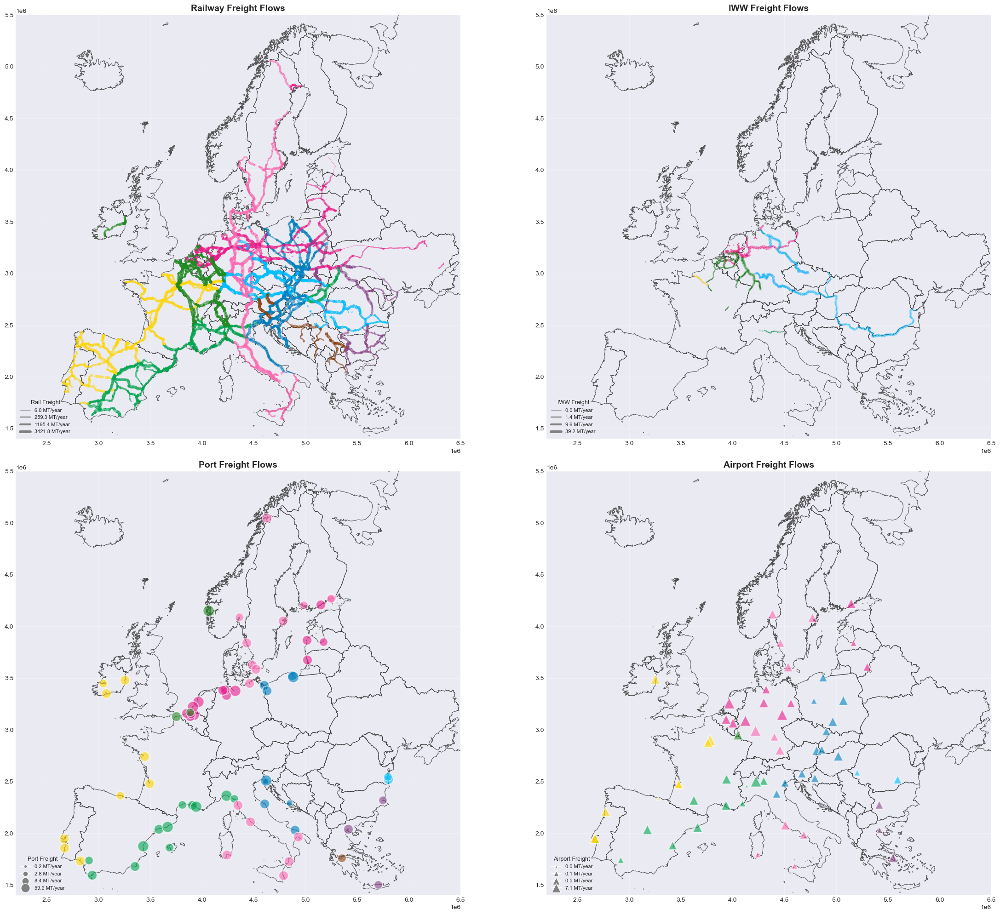

In [ ]:
# Prepare freight flow data
print("Preparing freight flow visualisation...\n")

# Aggregate ports by port_code
if 'ports' in infrastructure:
    freight_cols = [col for col in infrastructure['ports'].columns if 'freight' in col.lower() and 'computed' in col.lower()]
    ports_agg = aggregate_by_location(infrastructure['ports'], 'port_code', freight_cols, 'total_freight')
    if ports_agg is not None:
        infrastructure['ports_agg'] = ports_agg

# Aggregate airports
if 'airports' in infrastructure:
    freight_cols = [col for col in infrastructure['airports'].columns if 'freight' in col.lower() and 'computed' in col.lower()]
    if freight_cols:
        infrastructure['airports']['total_freight'] = infrastructure['airports'][freight_cols].fillna(0).sum(axis=1)


fig, axes = plt.subplots(2, 2, figsize=(24, 20))
axes = axes.flatten()

# Railway freight flows
setup_ax(axes[0], europe_countries, infrastructure, 'Railway Freight Flows')
if 'railway_edges' in infrastructure and 'flow_rail_freight' in infrastructure['railway_edges'].columns:
    railway_with_flow = infrastructure['railway_edges'][infrastructure['railway_edges']['flow_rail_freight'] > 0].copy()
    
    if len(railway_with_flow) > 0:
        p05, p35, p65, p95 = railway_with_flow['flow_rail_freight'].quantile([0.05, 0.35, 0.65, 0.95])
        railway_with_flow['linewidth'] = railway_with_flow['flow_rail_freight'].apply(
            lambda x: get_linewidth_freight(x, (p05, p35, p65, p95))
        )
        plot_by_corridor_and_visual_attr(axes[0], railway_with_flow, corridor_colors, 'linewidth')
        
        # Add legend
        line_legend = create_flow_legend((p05, p35, p65, p95), unit='MT/year', is_freight=True)
        axes[0].legend(handles=line_legend, title='Rail Freight', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# IWW freight flows
setup_ax(axes[1], europe_countries, infrastructure, 'IWW Freight Flows')
if 'iww_edges' in infrastructure and 'flow_iww_freight' in infrastructure['iww_edges'].columns:
    iww_with_flow = infrastructure['iww_edges'][infrastructure['iww_edges']['flow_iww_freight'] > 0].copy()
    
    if len(iww_with_flow) > 0:
        p05, p35, p65, p95 = iww_with_flow['flow_iww_freight'].quantile([0.05, 0.35, 0.65, 0.95])
        iww_with_flow['linewidth'] = iww_with_flow['flow_iww_freight'].apply(
            lambda x: get_linewidth_freight(x, (p05, p35, p65, p95))
        )
        plot_by_corridor_and_visual_attr(axes[1], iww_with_flow, corridor_colors, 'linewidth')
        
        line_legend = create_flow_legend((p05, p35, p65, p95), unit='MT/year', is_freight=True)
        axes[1].legend(handles=line_legend, title='IWW Freight', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# Port freight flows
setup_ax(axes[2], europe_countries, infrastructure, 'Port Freight Flows')
if 'ports_agg' in infrastructure:
    ports_with_flow = infrastructure['ports_agg'][infrastructure['ports_agg']['total_freight'] > 0].copy()
    
    if len(ports_with_flow) > 0:
        p05, p35, p65, p95 = ports_with_flow['total_freight'].quantile([0.05, 0.35, 0.65, 0.95])
        ports_with_flow['markersize'] = ports_with_flow['total_freight'].apply(
            lambda x: get_markersize_freight(x, (p05, p35, p65, p95))
        )
        plot_by_corridor_and_visual_attr(axes[2], ports_with_flow, corridor_colors, 'markersize', marker='o')
        
        bubble_legend = create_flow_legend((p05, p35, p65, p95), unit='MT/year', marker='o', is_freight=True)
        axes[2].legend(handles=bubble_legend, title='Port Freight', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# Airport freight flows
setup_ax(axes[3], europe_countries, infrastructure, 'Airport Freight Flows')
if 'airports' in infrastructure and 'total_freight' in infrastructure['airports'].columns:
    airports_with_flow = infrastructure['airports'][infrastructure['airports']['total_freight'] > 0].copy()
    
    if len(airports_with_flow) > 0:
        p05, p35, p65, p95 = airports_with_flow['total_freight'].quantile([0.05, 0.35, 0.65, 0.95])
        airports_with_flow['markersize'] = airports_with_flow['total_freight'].apply(
            lambda x: get_markersize_freight(x, (p05, p35, p65, p95))
        )
        plot_by_corridor_and_visual_attr(axes[3], airports_with_flow, corridor_colors, 'markersize', marker='^')
        
        bubble_legend = create_flow_legend((p05, p35, p65, p95), unit='MT/year', marker='^', is_freight=True)
        axes[3].legend(handles=bubble_legend, title='Airport Freight', 
                      loc='lower left', fontsize=8, title_fontsize=9)

plt.tight_layout()
plt.show()

## 5. Passenger Flows Visualisation

Passenger flows concentrate around major metropolitan areas and tourist destinations. Disruptions to these high-volume routes have significant socioeconomic impacts.

Maps showing annual passenger volumes across TEN-T corridors, measured in millions of trips per year:

- **Railway passengers**: Urban corridors and high-speed rail routes show highest volumes.
- **Airport passengers**: Hub airports dominate with tens of millions of annual passengers.
- **Port passengers**: Ferry services, cruise terminals, especially in Mediterranean and Baltic regions.

Preparing passenger flow visualization...



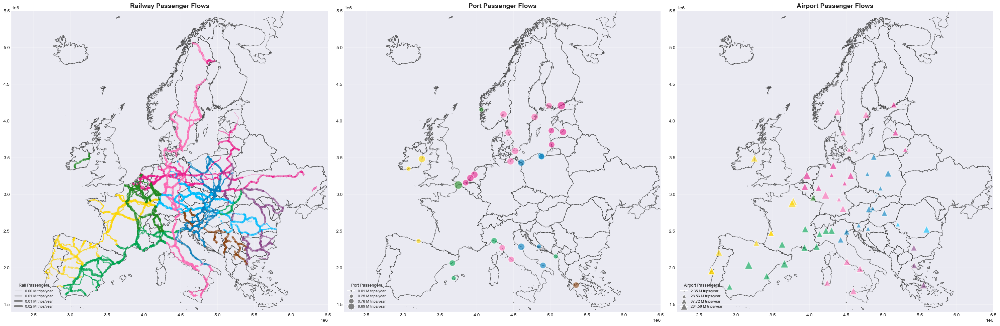

In [5]:
# Prepare passenger flow data
print("Preparing passenger flow visualization...\n")

# Aggregate ports by port_code for passengers
if 'ports' in infrastructure:
    passenger_cols = [col for col in infrastructure['ports'].columns if 'passenger' in col.lower() and 'computed' in col.lower()]
    ports_pass_agg = aggregate_by_location(infrastructure['ports'], 'port_code', passenger_cols, 'total_passenger')
    if ports_pass_agg is not None:
        infrastructure['ports_pass_agg'] = ports_pass_agg

# Aggregate airports for passengers
if 'airports' in infrastructure:
    passenger_cols = [col for col in infrastructure['airports'].columns if 'passenger' in col.lower() and 'computed' in col.lower()]
    if passenger_cols:
        infrastructure['airports']['total_passenger'] = infrastructure['airports'][passenger_cols].fillna(0).sum(axis=1)

fig, axes = plt.subplots(1, 3, figsize=(30, 12))

# Railway passenger flows
setup_ax(axes[0], europe_countries, infrastructure, 'Railway Passenger Flows')
if 'railway_edges' in infrastructure and 'flow_rail_passenger' in infrastructure['railway_edges'].columns:
    railway_with_flow = infrastructure['railway_edges'][infrastructure['railway_edges']['flow_rail_passenger'] > 0].copy()
    
    if len(railway_with_flow) > 0:
        p05, p35, p65, p95 = railway_with_flow['flow_rail_passenger'].quantile([0.05, 0.35, 0.65, 0.95])
        railway_with_flow['linewidth'] = railway_with_flow['flow_rail_passenger'].apply(
            lambda x: get_linewidth_passenger(x, (p05, p35, p65, p95))
        )
        plot_by_corridor_and_visual_attr(axes[0], railway_with_flow, corridor_colors, 'linewidth')
        
        line_legend = create_flow_legend((p05, p35, p65, p95), unit='M trips/year', is_freight=False)
        axes[0].legend(handles=line_legend, title='Rail Passengers', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# Port passenger flows
setup_ax(axes[1], europe_countries, infrastructure, 'Port Passenger Flows')
if 'ports_pass_agg' in infrastructure:
    ports_with_flow = infrastructure['ports_pass_agg'][infrastructure['ports_pass_agg']['total_passenger'] > 0].copy()
    
    if len(ports_with_flow) > 0:
        p05, p35, p65, p95 = ports_with_flow['total_passenger'].quantile([0.05, 0.35, 0.65, 0.95])
        ports_with_flow['markersize'] = ports_with_flow['total_passenger'].apply(
            lambda x: get_markersize_passenger(x, (p05, p35, p65, p95))
        )
        plot_by_corridor_and_visual_attr(axes[1], ports_with_flow, corridor_colors, 'markersize', marker='o')
        
        bubble_legend = create_flow_legend((p05, p35, p65, p95), unit='M trips/year', marker='o', is_freight=False)
        axes[1].legend(handles=bubble_legend, title='Port Passengers', 
                      loc='lower left', fontsize=8, title_fontsize=9)

# Airport passenger flows
setup_ax(axes[2], europe_countries, infrastructure, 'Airport Passenger Flows')
if 'airports' in infrastructure and 'total_passenger' in infrastructure['airports'].columns:
    airports_with_flow = infrastructure['airports'][infrastructure['airports']['total_passenger'] > 0].copy()
    
    if len(airports_with_flow) > 0:
        p05, p35, p65, p95 = airports_with_flow['total_passenger'].quantile([0.05, 0.35, 0.65, 0.95])
        airports_with_flow['markersize'] = airports_with_flow['total_passenger'].apply(
            lambda x: get_markersize_passenger(x, (p05, p35, p65, p95))
        )
        plot_by_corridor_and_visual_attr(axes[2], airports_with_flow, corridor_colors, 'markersize', marker='^')
        
        bubble_legend = create_flow_legend((p05, p35, p65, p95), unit='M trips/year', marker='^', is_freight=False)
        axes[2].legend(handles=bubble_legend, title='Airport Passengers', 
                      loc='lower left', fontsize=8, title_fontsize=9)

plt.tight_layout()
plt.show()

## 6. Hazard Exposure Quantification

Visualisation of climate hazard intensities across Europe using raster data:

These maps reveal which geographic areas face the highest hazard intensities. Overlaying infrastructure on these maps (next sections) identifies exposed assets and quantifies climate risks.

- **Return period (RP)**: RP100 = event expected once every 100 years on average.
- **Flood depth maps**: River flood inundation depth (meters) for RP100 events (1% annual probability).
- **Wind speed maps**: Maximum wind speeds (m/s) for RP100 windstorm events.

Loading 100-year return period hazard maps...
Processing flood raster...
Processing wind raster...


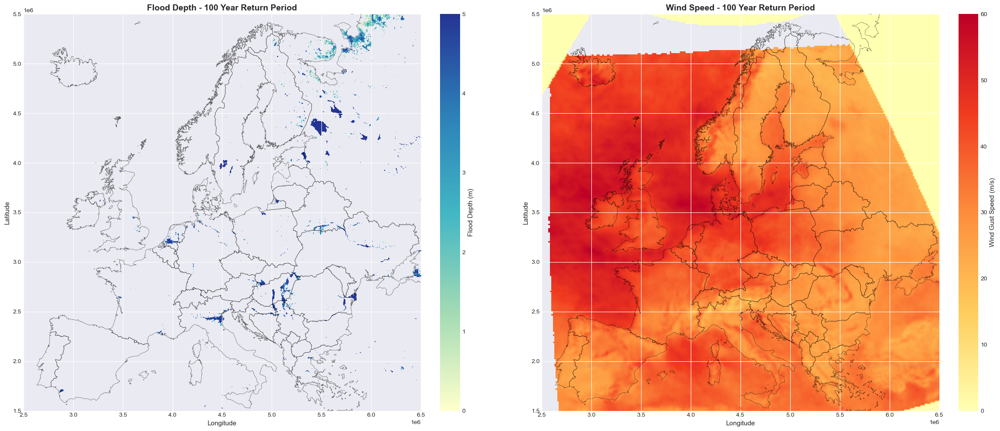

In [ ]:
# Paths to hazard maps
hazard_dir = code_dir.parent / "inputs" / "climate_hazards"
flood_map_path = hazard_dir / "River_flood" / "RP100_europe.tif"
wind_map_path = hazard_dir / "Windstorms" / "RP100_europe.tif"

# Load hazard maps with downsampling for faster visualizsation
print("Loading 100-year return period hazard maps...")

fig, axes = plt.subplots(1, 2, figsize=(24, 10))

# Load and reproject rasters using utility function
flood_raster = reproject_raster_to_3035(flood_map_path)
wind_raster = reproject_raster_to_3035(wind_map_path)

# Get Europe mask for clipping
from shapely.geometry import box
from rasterio.mask import mask as rio_mask

# Create bounding box from infrastructure
if 'railway_edges' in infrastructure:
    infra_bounds = infrastructure['railway_edges'].total_bounds
    bbox = gpd.GeoDataFrame(
        {'geometry': [box(*infra_bounds)]}, 
        crs='EPSG:3035'
    )

# Plot flood depth map
if flood_raster is not None:
    print("Processing flood raster...")
    
    # Create custom colormap for flood depth
    flood_cmap = colors.LinearSegmentedColormap.from_list(
        'flood', ['#ffffcc', '#a1dab4', '#41b6c4', '#2c7fb8', '#253494']
    )
    
    # Use show for proper georeferencing
    from rasterio.plot import show
    show(flood_raster, ax=axes[0], cmap=flood_cmap, interpolation='bilinear')
    
    # Overlay country boundaries
    if europe_countries is not None:
        europe_countries.boundary.plot(ax=axes[0], color='black', linewidth=0.5, alpha=0.6)
    
    axes[0].set_title('Flood Depth - 100 Year Return Period', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Longitude', fontsize=11)
    axes[0].set_ylabel('Latitude', fontsize=11)
    
    # Zoom to continental Europe (EPSG:3035 coordinates)
    axes[0].set_xlim(2_500_000, 6_500_000)  # West to East
    axes[0].set_ylim(1_500_000, 5_500_000)  # South to North
    
    # Add colorbar manually
    from matplotlib.cm import ScalarMappable
    from matplotlib.colors import Normalize
    sm1 = ScalarMappable(cmap=flood_cmap, norm=Normalize(vmin=0, vmax=5))
    sm1.set_array([])
    cbar1 = plt.colorbar(sm1, ax=axes[0], fraction=0.046, pad=0.04)
    cbar1.set_label('Flood Depth (m)', fontsize=11)

# Plot wind speed map
if wind_raster is not None:
    print("Processing wind raster...")
    
    # Create custom colormap for wind speed
    wind_cmap = colors.LinearSegmentedColormap.from_list(
        'wind', ['#ffffb2', '#fecc5c', '#fd8d3c', '#f03b20', '#bd0026']
    )
    
    # Use show for proper georeferencing
    show(wind_raster, ax=axes[1], cmap=wind_cmap, interpolation='bilinear')
    
    # Overlay country boundaries
    if europe_countries is not None:
        europe_countries.boundary.plot(ax=axes[1], color='black', linewidth=0.5, alpha=0.6)
    
    axes[1].set_title('Wind Speed - 100 Year Return Period', fontsize=14, fontweight='bold')
    axes[1].set_xlabel('Longitude', fontsize=11)
    axes[1].set_ylabel('Latitude', fontsize=11)
    
    # Zoom to continental Europe (EPSG:3035 coordinates)
    axes[1].set_xlim(2_500_000, 6_500_000)  # West to East
    axes[1].set_ylim(1_500_000, 5_500_000)  # South to North
    
    
    # Add colorbar manually
    wind_data = wind_raster.read(1, masked=True)
    sm2 = ScalarMappable(cmap=wind_cmap, norm=Normalize(vmin=0, 
                                                         vmax=60))
    sm2.set_array([])
    cbar2 = plt.colorbar(sm2, ax=axes[1], fraction=0.046, pad=0.04)
    cbar2.set_label('Wind Gust Speed (m/s)', fontsize=11)
    
plt.tight_layout()
plt.show()

## 7. Railway Flood Risk Analysis

This section analyses the direct economic impacts of river flooding on railway infrastructure. We examine:


1. **Exposure metrics**: Length of railway infrastructure exposed to flooding at different return periods.
2. **Damage assessment**: Direct economic damages to exposed assets based on flood depth and infrastructure replacement costs.
3. **Current conditions**: Risk under present-day climate (100-year return period events).
4. **Climate change scenarios**: How risks change under 1.5°C, 2.0°C, 3.0°C, and 4.0°C global warming scenarios.

In [8]:
# Load railway risk data
risk_dir = code_dir.parent / "inputs" / "risk" / "River_flood"
rail_risk_path = risk_dir / "rail_risk.parquet"
rail_risk_cc_path = risk_dir / "rail_risk_CC.parquet"

print("Loading railway flood risk data...\n")

# Load current conditions risk data
rail_risk = pd.read_parquet(rail_risk_path)
# Load climate change risk data
rail_risk_cc = pd.read_parquet(rail_risk_cc_path)

# Merge risk data with railway geometry using utility function
if 'railway_edges' in infrastructure:
    railway_with_risk = merge_risk_data_preserve_geometry(
        infrastructure['railway_edges'], 
        rail_risk, 
        rail_risk_cc
    )
else:
    print("\nWarning: Railway edges not loaded in infrastructure data")

    # Calculate derived metrics for RP100
railway_with_risk['pct_damage_100'] = (
    railway_with_risk['mean_damage_100'] / 
    (railway_with_risk['exposure_100'] * 5000)
) * 100

# Filter to assets with exposure
railway_exposed = railway_with_risk[railway_with_risk['exposure_100'] > 0].copy()

print(f"\nAssets exposed to RP100 flooding: {len(railway_exposed)}")
print(f"Total exposed length: {railway_exposed['exposure_100'].sum():.1f} m")
print(f"Total damage (RP100): €{railway_exposed['mean_damage_100'].sum()/1e6:.2f} million")
print(f"Total EAD: €{railway_exposed['EAD'].sum()/1e6:.2f} million")

Loading railway flood risk data...


Assets exposed to RP100 flooding: 167910
Total exposed length: 33710212.0 m
Total damage (RP100): €49405.95 million
Total EAD: €447.02 million


### Current Conditions

Visualization of railway flood risk under current climate conditions:
- **Direct Damage**: Monetary cost of repairs/replacement in euros for 100-year return period events.
- **Damage Percentage**: Proportion of asset value damaged (capped at 100% for visualization) for 100-year return period events.
- **Exposed Length**: Total meters of railway track exposed to flooding per asset for 100-year return period events.
- **Expected Annual Damage (EAD)**: Annualized damage costs accounting for all return periods and their probabilities.

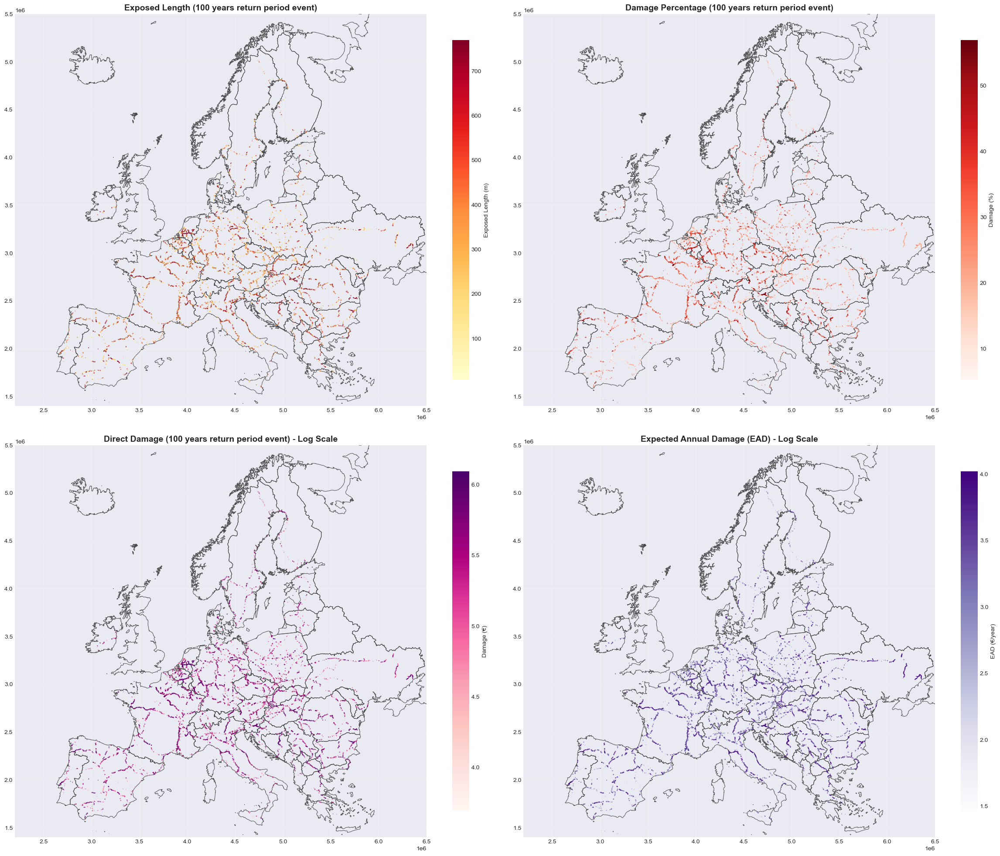

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(24, 20))
axes = axes.flatten()

# 1. Exposed Length (m)
setup_ax(axes[0], europe_countries, infrastructure, 'Exposed Length (100 years return period event)')
# Normalize colormap to p05-p95 range for better visibility
vmin_exp = railway_exposed['exposure_100'].quantile(0.05)
vmax_exp = railway_exposed['exposure_100'].quantile(0.95)
railway_exposed.plot(
    ax=axes[0],
    column='exposure_100',
    cmap='YlOrRd',
    linewidth=1.5,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Exposed Length (m)', 'shrink': 0.8},
    vmin=vmin_exp,
    vmax=vmax_exp
)

# 2. Damage Percentage
setup_ax(axes[1], europe_countries, infrastructure, 'Damage Percentage (100 years return period event)')
# Cap at 100% for visualization
railway_exposed_capped = railway_exposed.copy()
railway_exposed_capped['pct_damage_100_capped'] = railway_exposed_capped['pct_damage_100'].clip(upper=100)
vmin_pct = railway_exposed_capped['pct_damage_100_capped'].quantile(0.05)
vmax_pct = railway_exposed_capped['pct_damage_100_capped'].quantile(0.95)
railway_exposed_capped.plot(
    ax=axes[1],
    column='pct_damage_100_capped',
    cmap='Reds',
    linewidth=1.5,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Damage (%)', 'shrink': 0.8},
    vmin=vmin_pct,
    vmax=vmax_pct
)

# 3. Direct Damage (RP100) - Log Scale
setup_ax(axes[2], europe_countries, infrastructure, 'Direct Damage (100 years return period event) - Log Scale')
# Use log10 transformation for better visualisation of wide range
railway_exposed_dmg = railway_exposed.copy()
railway_exposed_dmg['log_mean_damage_100'] = np.log10(railway_exposed_dmg['mean_damage_100'].replace(0, np.nan))
vmin_dmg = railway_exposed_dmg['log_mean_damage_100'].quantile(0.05)
vmax_dmg = railway_exposed_dmg['log_mean_damage_100'].quantile(0.95)
railway_exposed_dmg.plot(
    ax=axes[2],
    column='log_mean_damage_100',
    cmap='RdPu',
    linewidth=1.5,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'Damage (€)', 'shrink': 0.8},
    vmin=vmin_dmg,
    vmax=vmax_dmg
)
# Format colorbar with powers of 10
cbar_dmg = axes[2].collections[0].colorbar
format_log_colorbar(cbar_dmg)

# 4. Expected Annual Damage (EAD) - Log Scale
setup_ax(axes[3], europe_countries, infrastructure, 'Expected Annual Damage (EAD) - Log Scale')
railway_exposed_ead = railway_exposed.copy()
railway_exposed_ead['log_EAD'] = np.log10(railway_exposed_ead['EAD'].replace(0, np.nan))
vmin_ead = railway_exposed_ead['log_EAD'].quantile(0.05)
vmax_ead = railway_exposed_ead['log_EAD'].quantile(0.95)
railway_exposed_ead.plot(
    ax=axes[3],
    column='log_EAD',
    cmap='Purples',
    linewidth=1.5,
    alpha=0.7,
    legend=True,
    legend_kwds={'label': 'EAD (€/year)', 'shrink': 0.8},
    vmin=vmin_ead,
    vmax=vmax_ead
)
# Format colorbar with powers of 10
cbar_ead = axes[3].collections[0].colorbar
format_log_colorbar(cbar_ead)

plt.tight_layout()
plt.show()

### Climate Change Scenarios - Interpolated Damages

This shows how the same infrastructure faces higher damages as climate change increases flood frequency.

Under climate change, the frequency of extreme flooding increases. A flood that currently occurs once every 100 years may become more frequent - occurring every 50, 30, or even 20 years under warmer scenarios.


This section interpolates damages by:
1. Taking the climate-adjusted return period for each warming scenario 
2. Interpolating damage values between known return periods 
3. Calculating total damages across the network for each scenario

Interpolating damages for climate change scenarios...


Damage interpolation completed
1.5C: Avg freq = 1.63x, plotting 167910 features
2.0C: Avg freq = 1.97x, plotting 167910 features
3.0C: Avg freq = 2.34x, plotting 167910 features
4.0C: Avg freq = 2.71x, plotting 167910 features


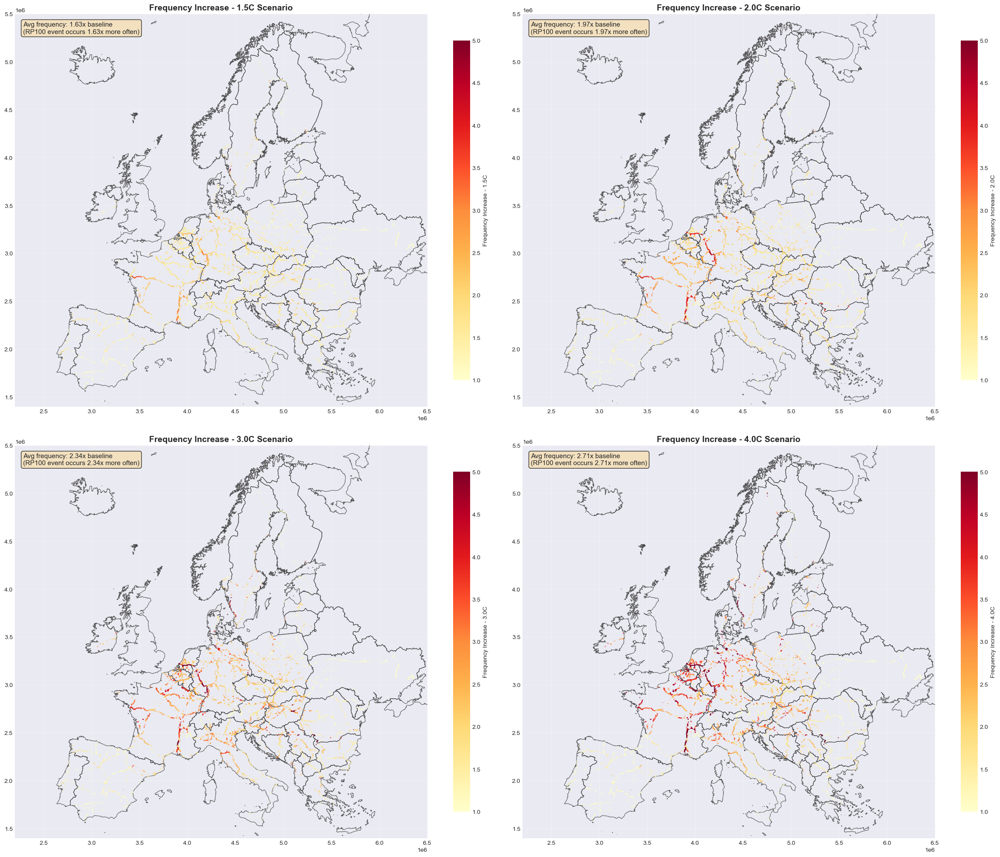

In [ ]:
# Interpolate damages for climate change scenarios
scenarios = ['1.5C', '2.0C', '3.0C', '4.0C']
return_periods = [10,20,30,40,50,75,100, 200, 500]

print("Interpolating damages for climate change scenarios...\n")

for scenario in scenarios:
    adj_rp_col = f'adjusted_rp_100_{scenario}'
    damage_col = f'damage_cc_{scenario}'
    
    if adj_rp_col in railway_with_risk.columns:
        railway_with_risk[damage_col] = railway_with_risk['mean_damage_100']
        
        # Print summary
        total_damage = railway_with_risk[damage_col].sum()
        avg_adj_rp = railway_with_risk[adj_rp_col].mean()
    else:
        print(f"{scenario}: Column {adj_rp_col} not found")

print("\nDamage interpolation completed")

fig, axes = plt.subplots(2, 2, figsize=(24, 20))
axes = axes.flatten()

# Filter to exposed assets - preserve GeoDataFrame structure
railway_cc = railway_with_risk[railway_with_risk['exposure_100'] > 0].copy()

# Plot damage ratios for each scenario (scenario/baseline)
for idx, scenario in enumerate(scenarios):
    damage_col = f'damage_cc_{scenario}'
    ratio_col = f'damage_ratio_{scenario}'
    
    setup_ax(axes[idx], europe_countries, infrastructure, f'Frequency Increase - {scenario} Scenario')
    
    if damage_col in railway_cc.columns and 'mean_damage_100' in railway_cc.columns:
        # Calculate ratio: scenario damage / baseline damage
        railway_cc[ratio_col] = railway_cc[damage_col] / railway_cc['mean_damage_100'].replace(0, np.nan)
        
        freq_ratio_col = f'freq_ratio_{scenario}'
        adj_rp_col = f'adjusted_rp_100_{scenario}'
        railway_cc[freq_ratio_col] = 100 / railway_cc[adj_rp_col].replace(0, np.nan)
        
        # Use frequency ratio for visualisation instead
        vmin = 1
        vmax = 5
        
        print(f"{scenario}: Avg freq = {railway_cc[freq_ratio_col].mean():.2f}x, plotting {len(railway_cc)} features")
        
        im = railway_cc.plot(
            ax=axes[idx],
            column=freq_ratio_col,
            cmap='YlOrRd',
            linewidth=1.5,
            alpha=0.7,
            legend=True,
            legend_kwds={'label': f'Frequency Increase - {scenario}', 'shrink': 0.8},
            vmin=vmin,
            vmax=vmax
        )
        
        # Add text annotation with average frequency increase
        avg_freq_ratio = railway_cc[freq_ratio_col].mean()
        axes[idx].text(0.02, 0.98, f'Avg frequency: {avg_freq_ratio:.2f}x baseline\n(RP100 event occurs {avg_freq_ratio:.2f}x more often)',
                      transform=axes[idx].transAxes, fontsize=11,
                      verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    else:
        axes[idx].text(0.5, 0.5, f'Data not available for {scenario}', 
                      ha='center', va='center', transform=axes[idx].transAxes)

plt.tight_layout()
plt.show()

### Climate Change Scenarios - Expected Annual Damage (EAD)

EAD is crucial for long-term infrastructure planning and climate adaptation investment decisions. It translates probabilistic risk into actionable financial metrics.

EAD (Expected Annual Damage) integrates damages across all return periods to estimate average annual costs:

- **Risk escalation**: Higher warming = higher EAD as extreme events become more frequent.
- **Methodology**: EAD = sum of (damage at each RP) × (annual probability of that RP).
- **Interpretation**: EAD represents the annualized budget needed for repairs/replacements under each scenario.
- **Climate scenarios**: Calculated separately for 1.5°C, 2.0°C, 3.0°C, and 4.0°C warming levels.

Checking EAD columns for climate scenarios:
  EAD_1.5C: €633.69 million/year
  EAD_2.0C: €750.65 million/year
  EAD_3.0C: €867.59 million/year
  EAD_4.0C: €946.86 million/year


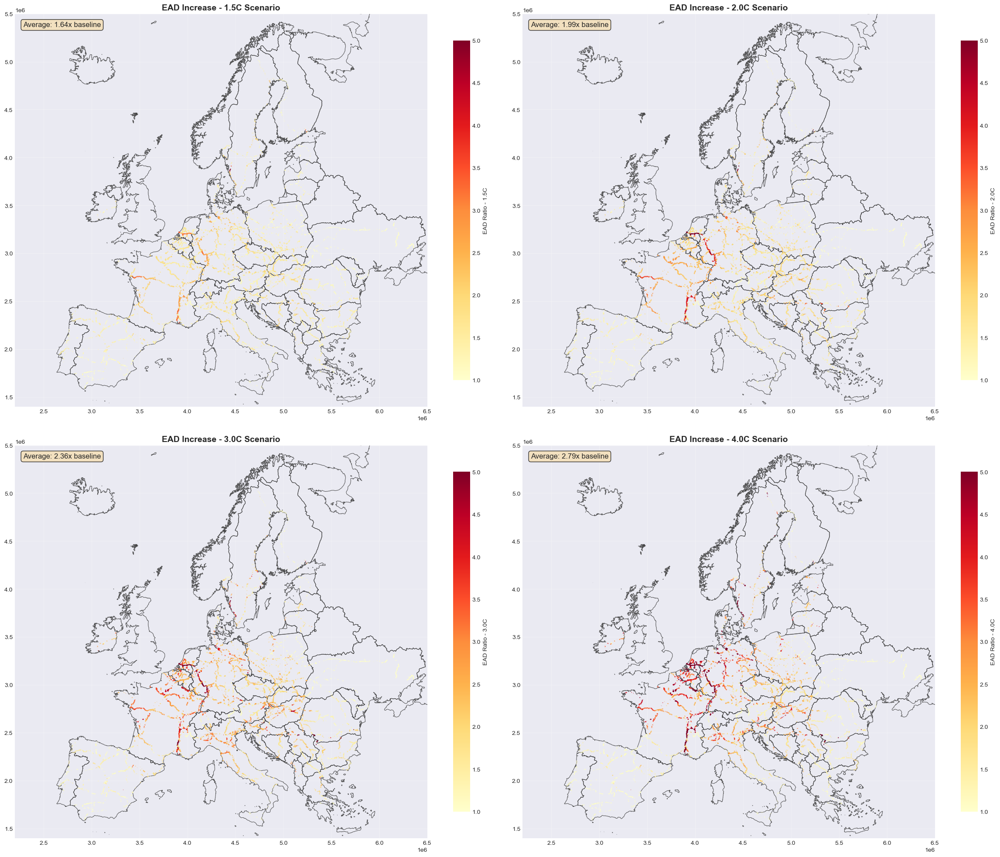

In [11]:
# Check EAD columns for climate scenarios
ead_scenarios = ['1.5C', '2.0C', '3.0C', '4.0C']
ead_columns = [f'EAD_{scenario}' for scenario in ead_scenarios]

print("Checking EAD columns for climate scenarios:")
for col in ead_columns:
    if col in railway_with_risk.columns:
        total_ead = railway_with_risk[col].sum()
        print(f"  {col}: €{total_ead/1e6:.2f} million/year")
    else:
        print(f"  {col}: Not found")

fig, axes = plt.subplots(2, 2, figsize=(24, 20))
axes = axes.flatten()

# Plot EAD ratios for each climate scenario (scenario/baseline)
for idx, scenario in enumerate(ead_scenarios):
    ead_col = f'EAD_{scenario}'
    ratio_col = f'EAD_ratio_{scenario}'
    
    setup_ax(axes[idx], europe_countries, infrastructure, f'EAD Increase - {scenario} Scenario')
    
    if ead_col in railway_cc.columns and 'EAD' in railway_cc.columns:
        # Calculate ratio: scenario EAD / baseline EAD
        railway_cc[ratio_col] = railway_cc[ead_col] / railway_cc['EAD'].replace(0, np.nan)
        
        # Use fixed scale 1-5 for all scenarios
        vmin = 1
        vmax = 5
        
        im = railway_cc.plot(
            ax=axes[idx],
            column=ratio_col,
            cmap='YlOrRd',
            linewidth=1.5,
            alpha=0.7,
            legend=True,
            legend_kwds={'label': f'EAD Ratio - {scenario}', 'shrink': 0.8},
            vmin=vmin,
            vmax=vmax
        )
        
        # Add text annotation with average increase
        avg_ratio = railway_cc[ratio_col].mean()
        axes[idx].text(0.02, 0.98, f'Average: {avg_ratio:.2f}x baseline',
                      transform=axes[idx].transAxes, fontsize=12,
                      verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    else:
        axes[idx].text(0.5, 0.5, f'Data not available for {ead_col}', 
                      ha='center', va='center', transform=axes[idx].transAxes)

plt.tight_layout()
plt.show()